In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
matplotlib.style.use('seaborn')

In [2]:
df = pd.read_csv(r'D:\Data Science Shift Academy\hotel_booking_city_hotel.csv')

In [3]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,City Hotel,0,6,2015,July,27,1,0,2,1,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,City Hotel,1,88,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,NaN,0,Transient,76.5,0,1,Canceled,2015-07-01
2,City Hotel,1,65,2015,July,27,1,0,4,1,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,NaN,0,Transient,68.0,0,1,Canceled,2015-04-30
3,City Hotel,1,92,2015,July,27,1,2,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,NaN,0,Transient,76.5,0,2,Canceled,2015-06-23
4,City Hotel,1,100,2015,July,27,2,0,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,NaN,0,Transient,76.5,0,1,Canceled,2015-04-02


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           79330 non-null  object 
 1   is_canceled                     79330 non-null  int64  
 2   lead_time                       79330 non-null  int64  
 3   arrival_date_year               79330 non-null  int64  
 4   arrival_date_month              79330 non-null  object 
 5   arrival_date_week_number        79330 non-null  int64  
 6   arrival_date_day_of_month       79330 non-null  int64  
 7   stays_in_weekend_nights         79330 non-null  int64  
 8   stays_in_week_nights            79330 non-null  int64  
 9   adults                          79330 non-null  int64  
 10  children                        79326 non-null  float64
 11  babies                          79330 non-null  int64  
 12  meal                            

## Data Info

According to the data info above, we know that the non-null rows should be counted for 79330 rows. But, there are several columns that have null values (missing values) inside its row:
1. Children = 79326 non-null values
2. Country = 79306 non-null values
3. Agent = 71199 non-null values
4. Company = 3689 non-null values

## Handling Missing Values

1. Children Missing Value:

   Apparently, we have to replace the null value in 'children' column with 0. It happens because most likely, visitors who 
   don't include the children number value are not having any children. That's why they left the 'children' column with no 
   value at all. But, we will check first whether or not these visitors have babies that probably we're not included in  
   'children' column in the first place.

In [5]:
print(df[df["children"].isnull()]['babies'])

540     0
607     0
619     0
1100    0
Name: babies, dtype: int64


Above result shows that we can change null value in 'children' column with 0 value, since they don't have babies as well.

In [6]:
#Replace the missing value in 'children' column with 0
df['children'].fillna(0, inplace = True)
#Check if the missing value in 'children' column is not existed
print(df[df["children"].isnull()]['children'])

Series([], Name: children, dtype: float64)


2. Country Missing Value: 

   Before we decide what kind of method that we will use to replace the missing value for the 'country' column, we want to    take a look at other columns. It's because it's quite bizzare if the hotel is not aware of basic thing such as where  
   does the visitor came from. If the other columnn that belong to these rows are also problematic, we will drop all of the 
   rows which have null value inside of the 'country' column, because it means the data could be indentified as spams or 
   coming from fake visitor's order.

In [7]:
#Which are the columns that have null values in 'country' column
print(df[df["country"].isnull()]['country'])

4831     NaN
4832     NaN
4833     NaN
4834     NaN
4835     NaN
4836     NaN
4837     NaN
4838     NaN
4839     NaN
4841     NaN
4842     NaN
4843     NaN
4844     NaN
4845     NaN
20591    NaN
21184    NaN
21185    NaN
21189    NaN
25847    NaN
25848    NaN
25849    NaN
25850    NaN
40770    NaN
61428    NaN
Name: country, dtype: object


In [8]:
# We will find out the other column samples from the above result of null values 'country' column, whether or not it's problematic
display(df.iloc[4831:4840])

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
4831,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4832,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4833,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4834,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4835,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4836,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4837,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4838,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16
4839,City Hotel,1,193,2015,October,42,15,0,3,2,0.0,0,BB,NaN,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,12.0,NaN,0,Transient,65.0,0,0,Canceled,2015-09-16


As we can see, the other columns which have null value in 'country' column is also problematic. Here are the problems:
1. Reservation_status = All of the orders are canceled
2. Customer_type = Transient, when the booking is not part of a group or contract, and is not associated to other transient booking. It means that these orders are more anonymous.
3. Company = NaN, means that it also not belongs to certain company which make it more anonymous.
4. All of the columns are identically have the same exact values from row 4831 to row 4839.

It concludes that we need to drop all of the rows, in which it has null value in 'country' column, because most likely these rows are coming from the fake orders that received by the hotel.

In [9]:
#Drop all of the rows with null value in column 'country'
df.dropna(subset = ['country'], how = 'all', inplace = True)
#Check if the rows with null value in column 'country' have been dropped
print(df[df["country"].isnull()]['country'])

Series([], Name: country, dtype: object)


3. Agent Missing Value:
    
    In this case, agent is the ID of the travel agency that made the booking for the visitors. But, as we know that not all 
    of the hotel visitors made their booking through travel agency, it could be made by themself directly at the hotel 
    without the 3rd party help. So, from now on we can make a new ID for the independent booking (without any agent).

In [10]:
df.agent.unique()

array([  6.,   9.,   1.,   8.,  13.,  11.,   7.,  15.,  nan,  27.,  14.,
        22.,  17.,  10.,  28.,  42.,   3.,  20.,  19.,  40.,  45.,  34.,
        37.,  57.,  61.,  16.,  39.,  21.,  24.,  69.,  41.,  50.,  30.,
        54.,  52.,  12.,  44.,  26.,  64.,  31.,  29.,  83.,  32.,  63.,
        66.,  60.,  55.,  56.,  89., 159., 155.,  38.,  91.,  87., 118.,
        86., 134.,  85.,  94., 210., 214., 129., 179., 138., 174., 154.,
       170., 182., 153.,  93., 151., 119.,  35., 168.,   2., 147., 195.,
       173.,  58.,  53., 128., 133.,  79., 152., 235., 192.,   5., 171.,
       191., 187., 236., 162., 215., 270., 157., 281., 177., 287., 240.,
       132., 331., 234.,  98.,  77., 103., 107., 262., 355., 220., 104.,
       330., 326., 121., 254., 205., 378.,  23., 296., 290., 229., 390.,
        33., 286.,  47., 276., 425., 315., 484., 323., 403., 219., 394.,
       509., 111., 423.,   4.,  71.,  78.,  72.,  75.,  70.,  82.,  81.,
        74.,  92.,  99.,  90.,  95., 112., 117., 10

Based on the unique values of 'agent' column above, we can make a new ID for null value, which is an independent booking without agent.

Independent Booking ID = 0

In [11]:
#Replace the missing value in 'agent' column with new ID which is 0
df['agent'].fillna(0, inplace = True)
#Check if the missing value in 'agent' column is not existed
print(df[df["agent"].isnull()]['agent'])

Series([], Name: agent, dtype: float64)


4. Company Missing Value:
    
    First, we have to refer to the definition of 'company' column. It isID of the company/entity that made the booking or  
    responsible for paying the booking. ID is presented instead of designation for anonymity reasons. So, the reason behind 
    missing value is most likely because the visitors are not willing to show the company which made the booking for them, 
    or perhaps there are visitors who have an independent booking, without the company who made the booking for them. For 
    this case, we will do similar thing as the previous method, to create a new ID for visitors who don't include any value 
    on 'company' column.

In [12]:
df.company.unique()

array([ nan,  40.,  45.,  38.,   9.,  47.,  49.,  51.,  48.,  62.,  67.,
        68.,  84.,  65.,  91.,  37.,   8.,  14., 174., 207., 179., 209.,
       219.,  72., 221., 227., 153., 186., 218.,  78., 253., 202., 216.,
       275., 277., 233., 280., 309., 321., 331.,  93., 316.,  85., 107.,
       350., 334., 348., 405., 366., 365., 407., 242., 435., 150.,  73.,
       428., 385., 418., 197., 409., 450., 452., 169., 466.,  43., 115.,
       465., 329.,  46.,  76.,  96., 358., 100., 108., 110.,  81., 120.,
       116., 105., 101., 122.,  11., 135., 137., 139., 144., 142., 127.,
       130., 143., 148., 140., 149., 163., 160., 180., 238., 183., 222.,
       203., 185., 217., 215., 193., 213., 224., 237., 230., 234.,  35.,
       246., 245., 251., 255., 158., 258., 259., 260., 263., 411., 254.,
       272., 257., 271.,  18., 106., 210., 273., 278.,  71., 284., 292.,
       282., 301., 305., 307., 293., 264., 311., 304., 308., 313., 288.,
       312., 317., 320., 314., 332., 333., 341., 34

Based on the unique values of 'company' column above, we can make a new ID for null value, which is an independent booking without company who made the booking for the visitors.

Independent Booking ID = 0

In [13]:
#Replace the missing value in 'agent' column with new ID which is 0
df['company'].fillna(0, inplace = True)
#Check if the missing value in 'agent' column is not existed
print(df[df['company'].isnull()]['company'])

Series([], Name: company, dtype: float64)


In [14]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,City Hotel,0,6,2015,July,27,1,0,2,1,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,City Hotel,1,88,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-07-01
2,City Hotel,1,65,2015,July,27,1,0,4,1,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1,Canceled,2015-04-30
3,City Hotel,1,92,2015,July,27,1,2,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2,Canceled,2015-06-23
4,City Hotel,1,100,2015,July,27,2,0,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-04-02


In [15]:
#Check if the missing values have now been solved
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79306 entries, 0 to 79329
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           79306 non-null  object 
 1   is_canceled                     79306 non-null  int64  
 2   lead_time                       79306 non-null  int64  
 3   arrival_date_year               79306 non-null  int64  
 4   arrival_date_month              79306 non-null  object 
 5   arrival_date_week_number        79306 non-null  int64  
 6   arrival_date_day_of_month       79306 non-null  int64  
 7   stays_in_weekend_nights         79306 non-null  int64  
 8   stays_in_week_nights            79306 non-null  int64  
 9   adults                          79306 non-null  int64  
 10  children                        79306 non-null  float64
 11  babies                          79306 non-null  int64  
 12  meal                            

## Checking Outliers

In [16]:
#Check the arrival date week number outliers
df.arrival_date_week_number.unique()

array([27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53,  1,  2,  3,  4,  5,  6,  7,
        8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26], dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='arrival_date_week_number'>

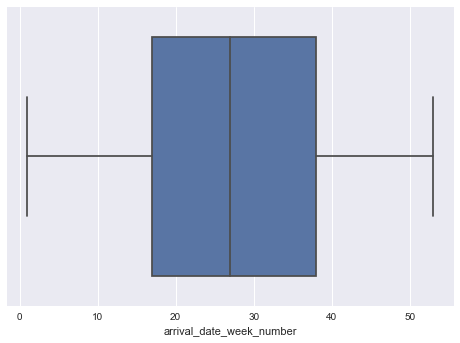

In [17]:
sns.boxplot(df['arrival_date_week_number'])

In [18]:
#Check the arrival date day of month outliers
df.arrival_date_day_of_month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31],
      dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='arrival_date_day_of_month'>

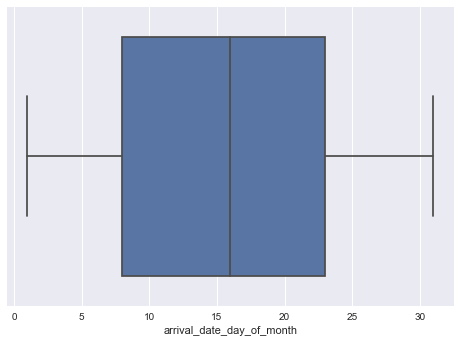

In [19]:
sns.boxplot(df['arrival_date_day_of_month'])

In [20]:
#Check the stays in weekend nights outliers
df.stays_in_weekend_nights.unique()

array([ 0,  2,  1,  3,  5,  4,  9,  6,  8,  7, 14, 10, 16, 13],
      dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='stays_in_weekend_nights'>

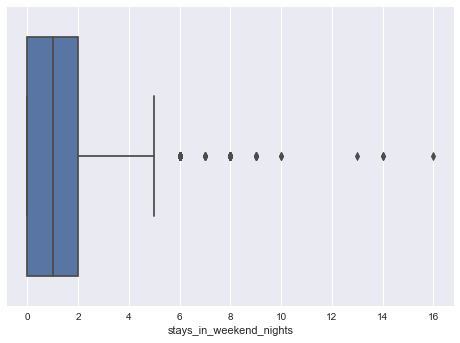

In [21]:
sns.boxplot(df['stays_in_weekend_nights'])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='stays_in_weekend_nights', ylabel='Density'>

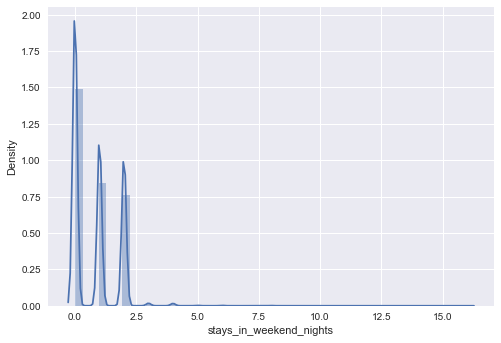

In [22]:
sns.distplot(df['stays_in_weekend_nights'])

In [23]:
#Check the stays in week nights outliers
df.stays_in_week_nights.unique()

array([ 2,  4,  3,  5,  1,  6,  8, 15,  7,  0, 11, 12, 20, 10,  9, 13, 14,
       18, 22, 17, 16, 21, 19, 34, 24, 35, 41, 25, 30], dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='stays_in_week_nights'>

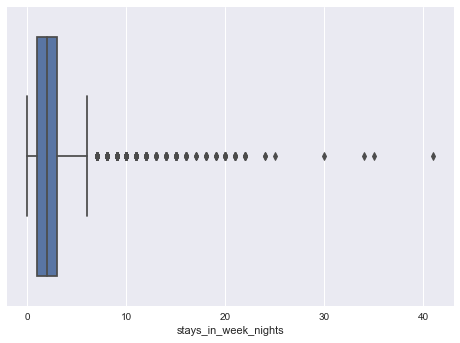

In [24]:
sns.boxplot(df['stays_in_week_nights'])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='stays_in_week_nights', ylabel='Density'>

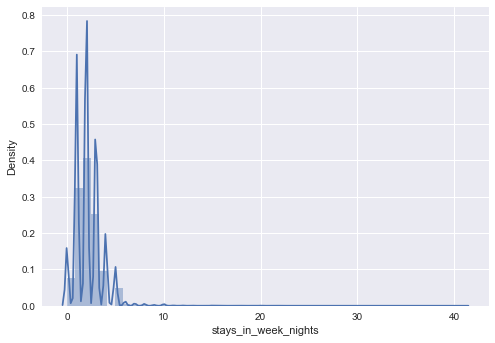

In [25]:
sns.distplot(df['stays_in_week_nights'])

In [26]:
#Check the adults outliers
df.adults.unique()

array([1, 2, 3, 0, 4], dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='adults'>

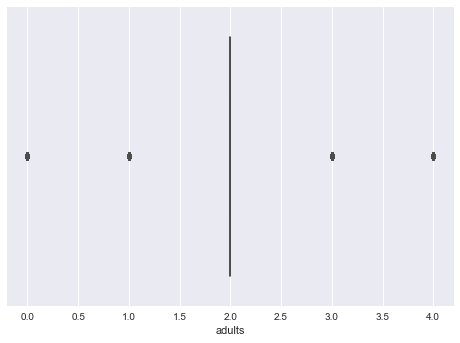

In [27]:
sns.boxplot(df['adults'])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='adults', ylabel='Density'>

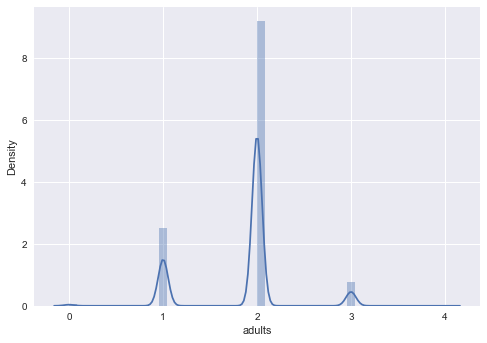

In [28]:
sns.distplot(df['adults'])

In [29]:
#Check the children outliers
df.children.unique()

array([0., 1., 2., 3.])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='children'>

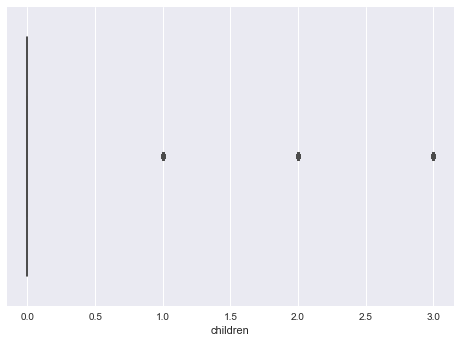

In [30]:
sns.boxplot(df['children'])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='children', ylabel='Density'>

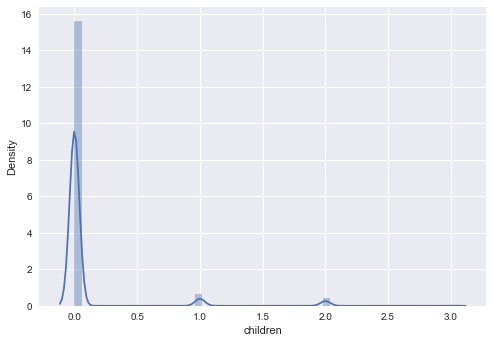

In [31]:
sns.distplot(df['children'])

In [32]:
#Check babies outliers
df.babies.unique()

array([ 0,  1, 10,  9,  2], dtype=int64)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='babies'>

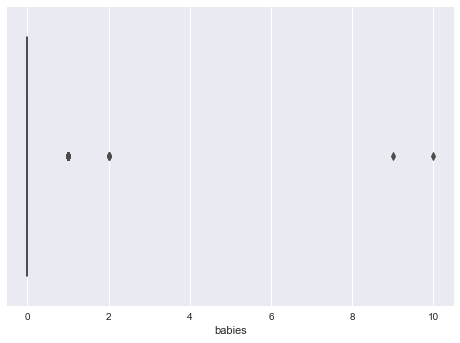

In [33]:
sns.boxplot(df['babies'])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='children', ylabel='Density'>

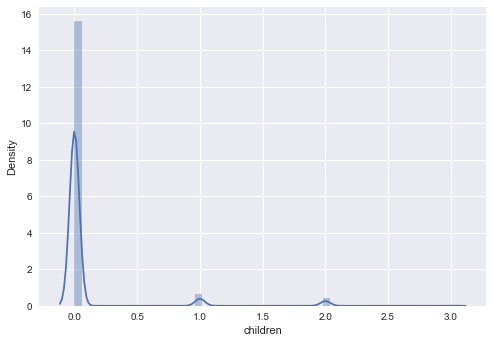

In [34]:
sns.distplot(df['children'])

In [35]:
#Outlier rows on 'babies' column
df[df['babies']>2]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
6559,City Hotel,0,37,2016,January,3,12,0,2,2,0.0,10,BB,PRT,Online TA,TA/TO,0,0,0,D,D,1,No Deposit,9.0,0.0,0,Transient,84.45,0,1,Check-Out,2016-01-14
38596,City Hotel,0,11,2015,October,42,11,2,1,1,0.0,9,BB,GBR,Corporate,Corporate,0,0,0,A,B,1,No Deposit,95.0,0.0,0,Transient-Party,95.00,0,0,Check-Out,2015-10-14


The result above shows that we have outliers in 'babies' column, because it's uncommon for the visitor to have 9 or 10 babies.

In [36]:
#Drop the outlier with the 'babies' value of 9
indexName = df[df['babies'] == 9].index
df.drop(indexName, inplace = True)

In [38]:
#Drop the outlier with the 'babies' value of 10
indexName = df[df['babies'] == 10].index
df.drop(indexName, inplace = True)

In [39]:
#Check if the outliers have been deleted
df[df['babies']>2]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


## EDA

In [40]:
df.duplicated().any()

True

In [43]:
df.drop_duplicates(keep=False, inplace=True)

In [44]:
df.duplicated().any()

False

#### 1. Tamu berasal dari mana?

In [52]:
df.country.unique()

array(['PRT', 'ITA', 'ESP', 'DEU', 'FRA', 'NLD', 'GBR', 'ROU', 'BRA',
       'SWE', 'AUT', 'AGO', 'BEL', 'CHE', 'NOR', 'ISR', 'IRL', 'RUS',
       'POL', 'CHN', 'USA', 'MAR', 'AUS', 'MOZ', 'TUN', 'DNK', 'MEX',
       'GRC', 'DZA', 'COL', 'LUX', 'CN', 'LVA', 'FIN', 'HRV', 'STP',
       'BGR', 'UKR', 'VEN', 'IRN', 'KOR', 'TUR', 'BLR', 'JPN', 'CZE',
       'HUN', 'AZE', 'KAZ', 'IND', 'NZL', 'IDN', 'LTU', 'LBN', 'SRB',
       'SVK', 'MYS', 'CMR', 'CHL', 'ARG', 'SGP', 'SEN', 'EGY', 'SAU',
       'SVN', 'KNA', 'JOR', 'ZAF', 'THA', 'KWT', 'LKA', 'ALB', 'ETH',
       'PHL', 'ARE', 'ECU', 'OMN', 'IRQ', 'AND', 'CPV', 'MUS', 'TWN',
       'HND', 'NGA', 'RWA', 'EST', 'PAK', 'GEO', 'GIB', 'PER', 'ZMB',
       'QAT', 'HKG', 'MCO', 'ISL', 'UZB', 'URY', 'IMN', 'ARM', 'MDV',
       'NIC', 'BEN', 'CYP', 'VGB', 'MLT', 'CRI', 'TZA', 'JEY', 'GAB',
       'MKD', 'BIH', 'VNM', 'GHA', 'BGD', 'TMP', 'KEN', 'DOM', 'MAC',
       'LIE', 'GNB', 'BHR', 'MNE', 'UMI', 'MYT', 'FRO', 'CIV', 'ZWE',
       'MMR', 'PAN', 

<AxesSubplot:xlabel='country', ylabel='arrival_date_week_number'>

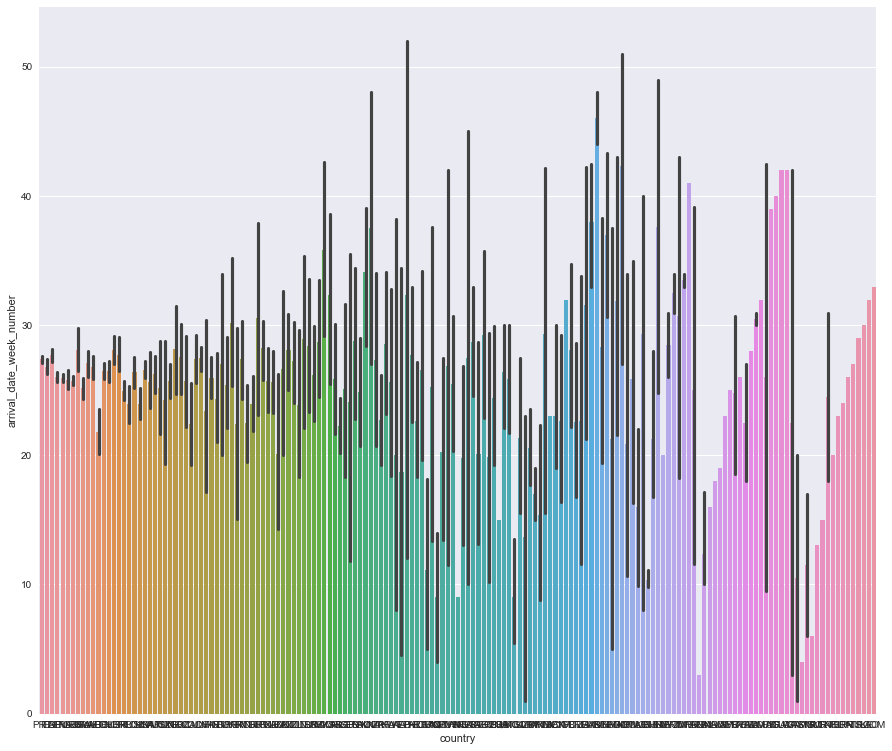

In [53]:
fig_dims = (15, 13)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = 'country', y = 'arrival_date_week_number', ax=ax, data=df)

<AxesSubplot:xlabel='country', ylabel='arrival_date_day_of_month'>

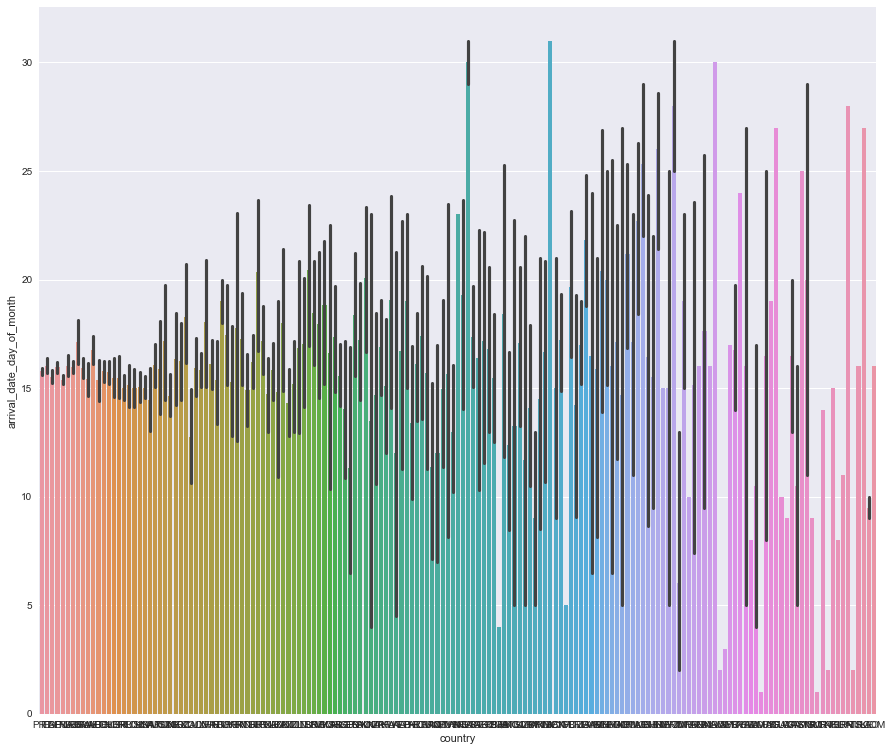

In [54]:
fig_dims = (15, 13)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = 'country', y = 'arrival_date_day_of_month', ax=ax, data=df)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='country', ylabel='count'>

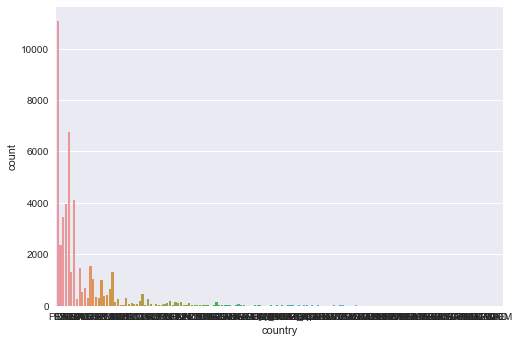

In [58]:
sns.countplot(df['country'])

In [61]:
#The most frequent visitor's country booking
df['country'].value_counts()

PRT    11075
FRA     6776
GBR     4104
DEU     3967
ESP     3444
ITA     2345
BEL     1541
BRA     1453
NLD     1312
USA     1308
CHE     1049
IRL      996
AUT      684
CHN      641
SWE      528
CN       455
POL      428
RUS      363
NOR      352
ISR      313
AGO      306
DNK      294
ROU      277
AUS      263
FIN      263
LUX      175
TUR      173
JPN      165
MAR      153
ARG      142
HUN      142
KOR      104
GRC      102
IND      101
CZE       98
HRV       74
IRN       73
DZA       63
MEX       63
ZAF       58
BGR       57
COL       53
CHL       48
UKR       45
EST       43
NZL       43
MOZ       41
SAU       41
SRB       39
TWN       35
ARE       34
TUN       34
SVK       32
THA       32
CYP       31
EGY       29
SVN       28
SGP       27
LTU       26
LBN       23
PHL       22
PER       22
ECU       21
URY       20
LVA       18
IDN       18
MYS       18
CPV       17
BLR       17
ISL       17
NGA       17
CRI       15
HKG       15
JOR       15
KAZ       14
MLT       14
VEN       14

#### 2.Berapa harga room per night? Ada perbedaan hargakah?

#### 3. Berapa lama tamu tinggal di hotel?

In [62]:
df.stays_in_weekend_nights.unique()

array([ 0,  2,  1,  3,  5,  4,  9,  6,  8,  7, 14, 10, 16, 13],
      dtype=int64)

In [63]:
df.stays_in_week_nights.unique()

array([ 2,  4,  3,  5,  1,  6,  8, 15,  0,  7, 11, 12, 20, 10,  9, 13, 14,
       18, 22, 17, 16, 21, 19, 34, 35, 41, 25, 30], dtype=int64)

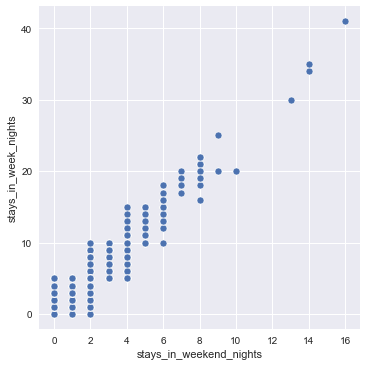

In [67]:
sns.relplot(x='stays_in_weekend_nights', y='stays_in_week_nights', data=df)

#### 4. Ada market segment?

In [174]:
#Because I skipped the EDA and move to machine learning section, I need to reload the data and clean the data back again
data = pd.read_csv(r'D:\Data Science Shift Academy\hotel_booking_city_hotel.csv')

In [176]:
#Replace the missing value in 'children' column with 0
data['children'].fillna(0, inplace = True)
#Check if the missing value in 'children' column is not existed
print(data[data["children"].isnull()]['children'])

Series([], Name: children, dtype: float64)


In [177]:
#Drop all of the rows with null value in column 'country'
data.dropna(subset = ['country'], how = 'all', inplace = True)
#Check if the rows with null value in column 'country' have been dropped
print(data[data["country"].isnull()]['country'])

Series([], Name: country, dtype: object)


In [178]:
#Replace the missing value in 'agent' column with new ID which is 0
data['agent'].fillna(0, inplace = True)
#Check if the missing value in 'agent' column is not existed
print(data[data["agent"].isnull()]['agent'])

Series([], Name: agent, dtype: float64)


In [179]:
#Replace the missing value in 'agent' column with new ID which is 0
data['company'].fillna(0, inplace = True)
#Check if the missing value in 'agent' column is not existed
print(data[data['company'].isnull()]['company'])

Series([], Name: company, dtype: float64)


In [181]:
#Drop the outlier with the 'babies' value of 9
indexName = data[data['babies'] == 9].index
data.drop(indexName, inplace = True)

In [184]:
#Drop the outlier with the 'babies' value of 10
indexName = data[data['babies'] == 10].index
data.drop(indexName, inplace = True)

In [185]:
data.drop_duplicates(keep=False, inplace=True)

In [186]:
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,City Hotel,0,6,2015,July,27,1,0,2,1,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,City Hotel,1,88,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-07-01
2,City Hotel,1,65,2015,July,27,1,0,4,1,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1,Canceled,2015-04-30
3,City Hotel,1,92,2015,July,27,1,2,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2,Canceled,2015-06-23
4,City Hotel,1,100,2015,July,27,2,0,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-04-02


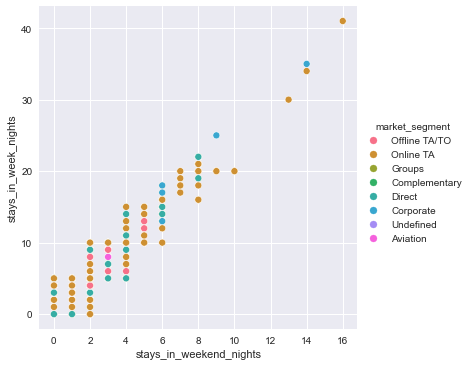

In [188]:
sns.relplot(x='stays_in_weekend_nights', y='stays_in_week_nights', data=data, hue='market_segment')

#### 5. Berapa banyak booking yang dicancel/tidak dicancel?

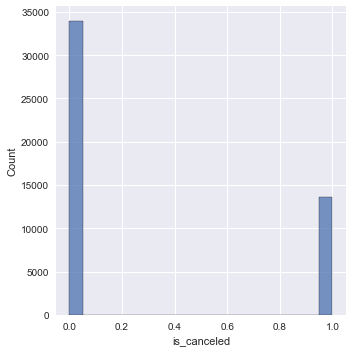

In [189]:
sns.displot(data, x='is_canceled')

In [190]:
df['is_canceled'].value_counts()

0    33935
1    13496
Name: is_canceled, dtype: int64

## Data Preprocessing

In [68]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,City Hotel,0,6,2015,July,27,1,0,2,1,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,City Hotel,1,88,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-07-01
2,City Hotel,1,65,2015,July,27,1,0,4,1,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1,Canceled,2015-04-30
3,City Hotel,1,92,2015,July,27,1,2,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2,Canceled,2015-06-23
4,City Hotel,1,100,2015,July,27,2,0,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1,Canceled,2015-04-02


### Encoding

In [76]:
#drop columns (hotel,  'arrival_date_year', 'meal', 'reservation_status_date', and 'reservation_status')

df.drop(columns=['hotel', 'arrival_date_year', 'meal', 'reservation_status_date', 'reservation_status'], inplace=True)

KeyError: "['hotel' 'arrival_date_year' 'meal' 'reservation_status_date'\n 'reservation_status'] not found in axis"

In [77]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,July,27,1,0,2,1,0.0,0,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0
1,1,88,July,27,1,0,4,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1
2,1,65,July,27,1,0,4,1,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1
3,1,92,July,27,1,2,4,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2
4,1,100,July,27,2,0,2,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1


In [78]:
from sklearn.preprocessing import LabelEncoder

1. Change the arrival_date_month into numerical

In [79]:
df.arrival_date_month.unique()

array(['July', 'August', 'September', 'October', 'November', 'December',
       'January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

In [80]:
lE = LabelEncoder()
df['arrival_date_month'] = lE.fit_transform(df['arrival_date_month'])

In [81]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1


2. Change the country into numerical

In [82]:
df.country.unique()

array(['PRT', 'ITA', 'ESP', 'DEU', 'FRA', 'NLD', 'GBR', 'ROU', 'BRA',
       'SWE', 'AUT', 'AGO', 'BEL', 'CHE', 'NOR', 'ISR', 'IRL', 'RUS',
       'POL', 'CHN', 'USA', 'MAR', 'AUS', 'MOZ', 'TUN', 'DNK', 'MEX',
       'GRC', 'DZA', 'COL', 'LUX', 'CN', 'LVA', 'FIN', 'HRV', 'STP',
       'BGR', 'UKR', 'VEN', 'IRN', 'KOR', 'TUR', 'BLR', 'JPN', 'CZE',
       'HUN', 'AZE', 'KAZ', 'IND', 'NZL', 'IDN', 'LTU', 'LBN', 'SRB',
       'SVK', 'MYS', 'CMR', 'CHL', 'ARG', 'SGP', 'SEN', 'EGY', 'SAU',
       'SVN', 'KNA', 'JOR', 'ZAF', 'THA', 'KWT', 'LKA', 'ALB', 'ETH',
       'PHL', 'ARE', 'ECU', 'OMN', 'IRQ', 'AND', 'CPV', 'MUS', 'TWN',
       'HND', 'NGA', 'RWA', 'EST', 'PAK', 'GEO', 'GIB', 'PER', 'ZMB',
       'QAT', 'HKG', 'MCO', 'ISL', 'UZB', 'URY', 'IMN', 'ARM', 'MDV',
       'NIC', 'BEN', 'CYP', 'VGB', 'MLT', 'CRI', 'TZA', 'JEY', 'GAB',
       'MKD', 'BIH', 'VNM', 'GHA', 'BGD', 'TMP', 'KEN', 'DOM', 'MAC',
       'LIE', 'GNB', 'BHR', 'MNE', 'UMI', 'MYT', 'FRO', 'CIV', 'ZWE',
       'MMR', 'PAN', 

In [83]:
lE = LabelEncoder()
df['country'] = lE.fit_transform(df['country'])

In [84]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1


3. Change the market_segment into numerical

In [85]:
df.market_segment.unique()

array(['Offline TA/TO', 'Online TA', 'Groups', 'Complementary', 'Direct',
       'Corporate', 'Undefined', 'Aviation'], dtype=object)

In [86]:
lE = LabelEncoder()
df['market_segment'] = lE.fit_transform(df['market_segment'])

In [87]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,TA/TO,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,TA/TO,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1


4. Change the distribution_channel into numerical

In [88]:
df.distribution_channel.unique()

array(['TA/TO', 'Direct', 'Undefined', 'Corporate', 'GDS'], dtype=object)

In [89]:
lE = LabelEncoder()
df['distribution_channel'] = lE.fit_transform(df['distribution_channel'])

In [90]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,A,A,0,No Deposit,6.0,0.0,0,Transient,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,A,A,0,No Deposit,9.0,0.0,0,Transient,76.5,0,1


5. Change the deposit_type into numerical

In [92]:
df.deposit_type.unique()

array(['No Deposit', 'Non Refund', 'Refundable'], dtype=object)

In [93]:
lE = LabelEncoder()
df['deposit_type'] = lE.fit_transform(df['deposit_type'])

In [94]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,A,A,0,0,6.0,0.0,0,Transient,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,Transient,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,Transient,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,Transient,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,Transient,76.5,0,1


6. Change the customer_type into numerical

In [95]:
df.customer_type.unique()

array(['Transient', 'Transient-Party', 'Contract', 'Group'], dtype=object)

In [96]:
lE = LabelEncoder()
df['customer_type'] = lE.fit_transform(df['customer_type'])

In [97]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,A,A,0,0,6.0,0.0,0,2,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,1


7. Change the reserved_room_type into numerical

In [101]:
df.reserved_room_type.unique()

array(['A', 'B', 'D', 'F', 'E', 'G', 'C'], dtype=object)

In [102]:
lE = LabelEncoder()
df['reserved_room_type'] = lE.fit_transform(df['reserved_room_type'])

In [103]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,0,A,0,0,6.0,0.0,0,2,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,0,A,0,0,9.0,0.0,0,2,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,0,A,0,0,9.0,0.0,0,2,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,0,A,0,0,9.0,0.0,0,2,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,0,A,0,0,9.0,0.0,0,2,76.5,0,1


8. Change the assigned_room_type into numerical

In [104]:
df.assigned_room_type.unique()

array(['A', 'B', 'F', 'D', 'G', 'E', 'K', 'C'], dtype=object)

In [105]:
lE = LabelEncoder()
df['assigned_room_type'] = lE.fit_transform(df['assigned_room_type'])

In [106]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


### Scaling

In this case I will only scale the data which is Not categorical variable (date, week, month, country, market_segment, distribution_channel, reserved_room_type, assigned_room_type, deposit_type, agent, company, and customer_type) because they are representing groups of category.

In [98]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,6,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,A,A,0,0,6.0,0.0,0,2,0.0,0,0
1,1,88,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,1
2,1,65,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,68.0,0,1
3,1,92,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,2
4,1,100,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,A,A,0,0,9.0,0.0,0,2,76.5,0,1


In [99]:
from sklearn.preprocessing import MinMaxScaler

In [109]:
scaler = MinMaxScaler()

1. Scaling lead_time

In [107]:
df['lead_time'] = scaler.fit_transform(np.array(df['lead_time']).reshape(-1,1))

In [108]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0,2,1,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0,4,1,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,2,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0,2,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


2. Scaling stays_in_weekend_nights

In [110]:
df['stays_in_weekend_nights'] = scaler.fit_transform(np.array(df['stays_in_weekend_nights']).reshape(-1,1))

In [111]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,2,1,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,4,1,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,4,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,2,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


3. Scaling stays_in_week_nights	

In [112]:
df['stays_in_week_nights'] = scaler.fit_transform(np.array(df['stays_in_week_nights']).reshape(-1,1))

In [113]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,1,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,1,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,2,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


4. Scaling adults

In [115]:
df['adults'] = scaler.fit_transform(np.array(df['adults']).reshape(-1,1))

In [116]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


5. Scaling children

In [117]:
df['children'] = scaler.fit_transform(np.array(df['children']).reshape(-1,1))

In [118]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


6. Scaling babies

In [119]:
df['babies'] = scaler.fit_transform(np.array(df['babies']).reshape(-1,1))

In [120]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


7. Scaling is_repeated_guest

In [121]:
df['is_repeated_guest'] = scaler.fit_transform(np.array(df['is_repeated_guest']).reshape(-1,1))

In [122]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


8. Scaling previous_cancellations

In [123]:
df['previous_cancellations'] = scaler.fit_transform(np.array(df['previous_cancellations']).reshape(-1,1))

In [124]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


9. Scaling previous_bookings_not_canceled

In [125]:
df['previous_bookings_not_canceled'] = scaler.fit_transform(np.array(df['previous_bookings_not_canceled']).reshape(-1,1))

In [126]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.0,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,76.5,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,68.0,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,76.5,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,76.5,0,1


10. Scalling ADR

In [127]:
df['adr'] = scaler.fit_transform(np.array(df['adr']).reshape(-1,1))

In [128]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.000000,0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.012593,0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0,1


11. Scaling required_car_parking_spaces	

In [129]:
df['required_car_parking_spaces'] = scaler.fit_transform(np.array(df['required_car_parking_spaces']).reshape(-1,1))

In [130]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.000000,0.0,0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,1
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.012593,0.0,1
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,2
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,1


12. Scaling total_of_special_requests

In [131]:
df['total_of_special_requests'] = scaler.fit_transform(np.array(df['total_of_special_requests']).reshape(-1,1))

In [132]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.000000,0.0,0.0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.012593,0.0,0.2
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.4
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2


### Logistic Regression

In [134]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix, classification_report

In [135]:
#Split Target and Feature
x = df.drop(['is_canceled'], axis = 1)
y = df['is_canceled']

#Train test split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 42) 


#fitting model
model_log = LogisticRegression()
model_log.fit(x_train, y_train)

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [136]:
x_train.shape

(38061, 26)

In [137]:
x_test.shape

(9516, 26)

In [138]:
model_log.coef_

array([[ 1.92767492e+00, -6.26398216e-03, -2.26264865e-03,
        -1.44644681e-03,  2.26823934e-01,  2.87685164e-01,
        -2.30776786e-01,  2.66156155e-01, -4.03055698e-02,
         4.91082907e-03,  1.32225687e-01,  2.72179294e-01,
        -6.20048199e-01,  1.92978406e-02, -7.72248736e-02,
         8.60326435e-01, -7.93375545e-01,  7.67638425e-03,
         5.49331517e-01, -5.60297924e-03, -8.80527476e-04,
        -7.85546600e-03, -3.98709218e-01,  2.09165153e-02,
        -7.13456491e-01, -2.69944739e+00]])

In [139]:
model_log.intercept_

array([-1.4579688])

In [140]:
pd.DataFrame({'Coefficient': model_log.coef_[0]}, index = df.iloc[:,1:].columns)

,Coefficient
lead_time,1.927675
arrival_date_month,-0.006264
arrival_date_week_number,-0.002263
arrival_date_day_of_month,-0.001446
stays_in_weekend_nights,0.226824
stays_in_week_nights,0.287685
adults,-0.230777
children,0.266156
babies,-0.040306
country,0.004911


In [141]:
model_log.predict(x_test) #Prediction for y_test

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [142]:
df.iloc[:5,1:]

,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.000000,0.0,0.0
1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2
2,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.012593,0.0,0.2
3,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.4
4,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2


In [143]:
model_log.predict(df.iloc[:5,1:]) #index column dari 1 hingga seterusnya dikarenakan index 0 adalah target feature

array([0, 0, 0, 0, 0], dtype=int64)

In [144]:
df.iloc[:5,0] #index 0 adalah target feature

0    0
1    1
2    1
3    1
4    1
Name: is_canceled, dtype: int64

In [145]:
y_pred_log = model_log.predict(x_test)

In [146]:
compare = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred_log})
compare

,Actual,Prediction
63446,0,0
14842,0,0
58758,0,0
52257,0,1
71466,0,0
14869,1,0
78716,0,0
46816,0,0
77234,0,0
58295,0,0


In [147]:
compare = compare.reset_index().iloc[:,1:]
compare

,Actual,Prediction
0,0,0
1,0,0
2,0,0
3,0,1
4,0,0
5,1,0
6,0,0
7,0,0
8,0,0
9,0,0


### Evaluation Matrix

TP: Prediction Positive, Actual Positive

TN: Prediction Negative, Actual Negative

FP: Prediction Positif, Actual Negative

FN: Prediction Negative, Actual Positive

In [148]:
result = []
for i, j in compare.iterrows():
    if j[0]==j[1]:
        if j[1]==1:
            result.append('True Positive')
        else:
            result.append('True Negative')
    else:
        if j[1] == 1:
            result.append('False Positive')
        else:
            result.append('False Negative')

In [149]:
result

['True Negative',
 'True Negative',
 'True Negative',
 'False Positive',
 'True Negative',
 'False Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'False Negative',
 'True Negative',
 'True Negative',
 'False Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'False Negative',
 'False Negative',
 'False Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'False Negative',
 'True Negative',
 'False Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'False Positive',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Positive',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'True Negative',
 'False Negative',
 'False Negative',
 'False Negative',
 'True Negative',
 'False Negative',
 'True Negative',
 'True Positive',
 'True Negative',
 'True Negative',
 'False Negative',
 'False Negative',
 'True Negat

In [150]:
compare['Result'] = result

In [151]:
compare

,Actual,Prediction,Result
0,0,0,True Negative
1,0,0,True Negative
2,0,0,True Negative
3,0,1,False Positive
4,0,0,True Negative
5,1,0,False Negative
6,0,0,True Negative
7,0,0,True Negative
8,0,0,True Negative
9,0,0,True Negative


In [152]:
compare['Result'].value_counts()

True Negative     6453
False Negative    2128
True Positive      543
False Positive     392
Name: Result, dtype: int64

In [153]:
confusion_matrix(y_test,y_pred_log)

array([[6453,  392],
       [2128,  543]], dtype=int64)

Text(52.0, 0.5, 'Actual Label')

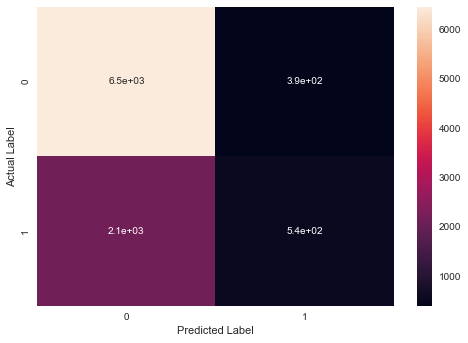

In [154]:
sns.heatmap(confusion_matrix(y_test, y_pred_log), annot = True)
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")

In [155]:
print(classification_report(y_test, y_pred_log))

              precision    recall  f1-score   support

           0       0.75      0.94      0.84      6845
           1       0.58      0.20      0.30      2671

    accuracy                           0.74      9516
   macro avg       0.67      0.57      0.57      9516
weighted avg       0.70      0.74      0.69      9516



### Decision Tree Classifier

In [156]:
from sklearn.tree import DecisionTreeClassifier

In [157]:
df.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,0.011583,5,27,1,0.000,0.048780,0.25,0.0,0.0,122,5,3,0.0,0.0,0.0,0,0,0,0,6.0,0.0,0,2,0.000000,0.0,0.0
1,1,0.169884,5,27,1,0.000,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2
2,1,0.125483,5,27,1,0.000,0.097561,0.25,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.012593,0.0,0.2
3,1,0.177606,5,27,1,0.125,0.097561,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.4
4,1,0.193050,5,27,2,0.000,0.048780,0.50,0.0,0.0,122,6,3,0.0,0.0,0.0,0,0,0,0,9.0,0.0,0,2,0.014167,0.0,0.2


In [158]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)
y_pred_dt = model_dt.predict(x_test)

In [159]:
y_pred_dt

array([1, 0, 0, ..., 0, 1, 1], dtype=int64)

In [160]:
compare['pred_dt'] = y_pred_dt
compare

,Actual,Prediction,Result,pred_dt
0,0,0,True Negative,1
1,0,0,True Negative,0
2,0,0,True Negative,0
3,0,1,False Positive,0
4,0,0,True Negative,0
5,1,0,False Negative,0
6,0,0,True Negative,0
7,0,0,True Negative,0
8,0,0,True Negative,0
9,0,0,True Negative,1


In [161]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83      6845
           1       0.56      0.58      0.57      2671

    accuracy                           0.76      9516
   macro avg       0.70      0.70      0.70      9516
weighted avg       0.76      0.76      0.76      9516



In [162]:
print(classification_report(y_test, y_pred_log)) #compare to logistic Regression

              precision    recall  f1-score   support

           0       0.75      0.94      0.84      6845
           1       0.58      0.20      0.30      2671

    accuracy                           0.74      9516
   macro avg       0.67      0.57      0.57      9516
weighted avg       0.70      0.74      0.69      9516



As we can see above that the result of the Decision Tree Classifier has more precision on predicting 0 or no cancelation (0 = 0.83), but less precision on predicting 1 or cancelation (1 = 0.56)

<AxesSubplot:>

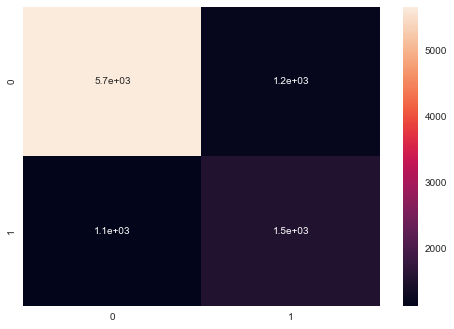

In [163]:
#Confusion matrix for Decission Tree Classifier
sns.heatmap(confusion_matrix(y_test,y_pred_dt), annot = True)

<AxesSubplot:>

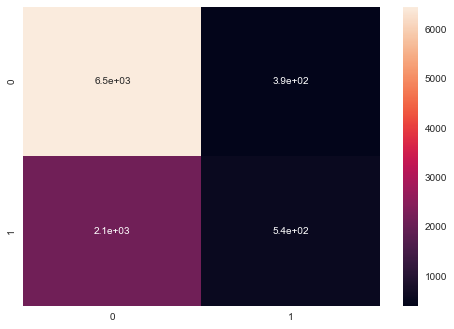

In [164]:
#Confusion matrix for logistic regression
sns.heatmap(confusion_matrix(y_test,y_pred_log), annot = True)

### Random Forrest Classifier

In [165]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve

In [166]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
y_pred_rf = model_rf.predict(x_test)

In [167]:
compare['pred_rf'] = y_pred_rf
compare

,Actual,Prediction,Result,pred_dt,pred_rf
0,0,0,True Negative,1,1
1,0,0,True Negative,0,0
2,0,0,True Negative,0,0
3,0,1,False Positive,0,0
4,0,0,True Negative,0,0
5,1,0,False Negative,0,0
6,0,0,True Negative,0,0
7,0,0,True Negative,0,0
8,0,0,True Negative,0,0
9,0,0,True Negative,1,0


In [168]:
print(classification_report(y_test,y_pred_rf))

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      6845
           1       0.72      0.59      0.65      2671

    accuracy                           0.82      9516
   macro avg       0.79      0.75      0.76      9516
weighted avg       0.81      0.82      0.82      9516



In [169]:
print(classification_report(y_test,y_pred_log))

              precision    recall  f1-score   support

           0       0.75      0.94      0.84      6845
           1       0.58      0.20      0.30      2671

    accuracy                           0.74      9516
   macro avg       0.67      0.57      0.57      9516
weighted avg       0.70      0.74      0.69      9516



In [170]:
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83      6845
           1       0.56      0.58      0.57      2671

    accuracy                           0.76      9516
   macro avg       0.70      0.70      0.70      9516
weighted avg       0.76      0.76      0.76      9516



<AxesSubplot:>

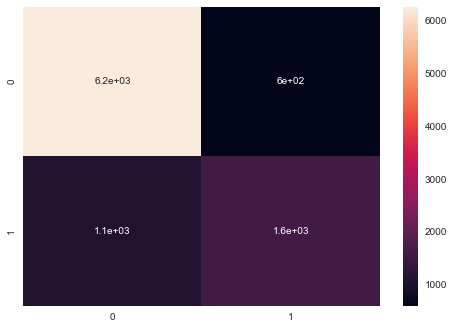

In [171]:
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot = True)

<AxesSubplot:>

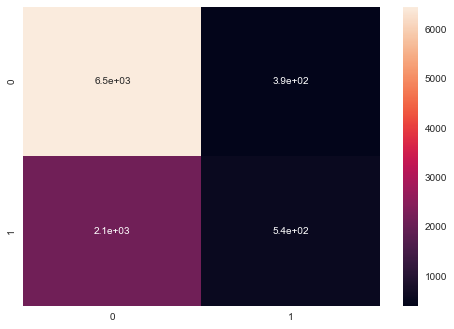

In [172]:
sns.heatmap(confusion_matrix(y_test, y_pred_log), annot = True)

<AxesSubplot:>

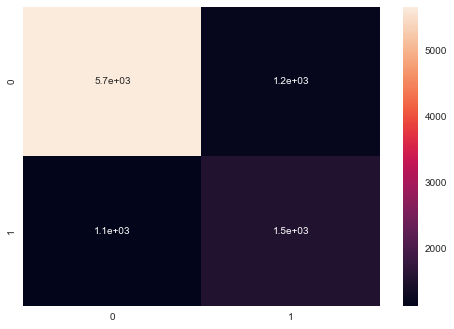

In [173]:
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot = True)